In [1]:
import numpy as np
from scipy.stats import norm
from scipy.io import loadmat
import os
import pickle

import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
import pandas as pd
import random
import multiprocessing as mp
from scipy.stats import pearsonr

# from FISH_TANK import *

In [2]:
data_path = '/Users/ulgenklc/Library/CloudStorage/OneDrive-TheMountSinaiHospital/kilicb01/Projects/BED-R21/'

names_BE = [st  for st in os.listdir(data_path + 'BE/') if st.split('_')[0] == 'fish']
names_HC = [st  for st in os.listdir(data_path + 'HC/') if st.split('_')[0] == 'fish']

n_BE = len(names_BE)
n_HC = len(names_HC)

In [3]:
types, subjects, blocks, trials, preds, trues, rewards, sources, observeds = [], [], [], [], [], [], [], [], []
for n, name in enumerate(names_BE + names_HC):
    if name in names_BE:
        data = loadmat(data_path + 'BE/'+name)['data']
        type = 'BED'
    elif name in names_HC:
        data = loadmat(data_path + 'HC/'+name)['data']
        type = 'HC'
    nBlocks = data.shape[0]
    nTrials = data[0][0].shape[0]
    for b in range(nBlocks):
        for i in range(nTrials):
            types.append(type)
            subjects.append(name.split('.')[0])
            blocks.append(b)
            trials.append(i)
            preds.append(data[b][0][i,0]-1)
            trues.append(data[b][0][i,1]-1) #adjust python indexing
            rewards.append(data[b][0][i,2])
            sources.append(data[b][0][i,3]-1)
            observeds.append(data[b][0][i,4]-1)
df = pd.DataFrame({'Morbidity':types, 'SubjectID':subjects, 'BlockID':blocks, 'TrialID':trials, 'PredLabels':preds, 'Truth':trues, 'Reward':rewards, 'TrueLabels':sources, 'ObservedLabel':observeds})
df.head()

,Morbidity,SubjectID,BlockID,TrialID,PredLabels,Truth,Reward,TrueLabels,ObservedLabel
0,BED,fish_803508212023,0,0,2,0,100,2,2
1,BED,fish_803508212023,0,1,2,0,100,2,1
2,BED,fish_803508212023,0,2,2,0,100,2,2
3,BED,fish_803508212023,0,3,2,0,100,2,0
4,BED,fish_803508212023,0,4,2,0,100,2,2


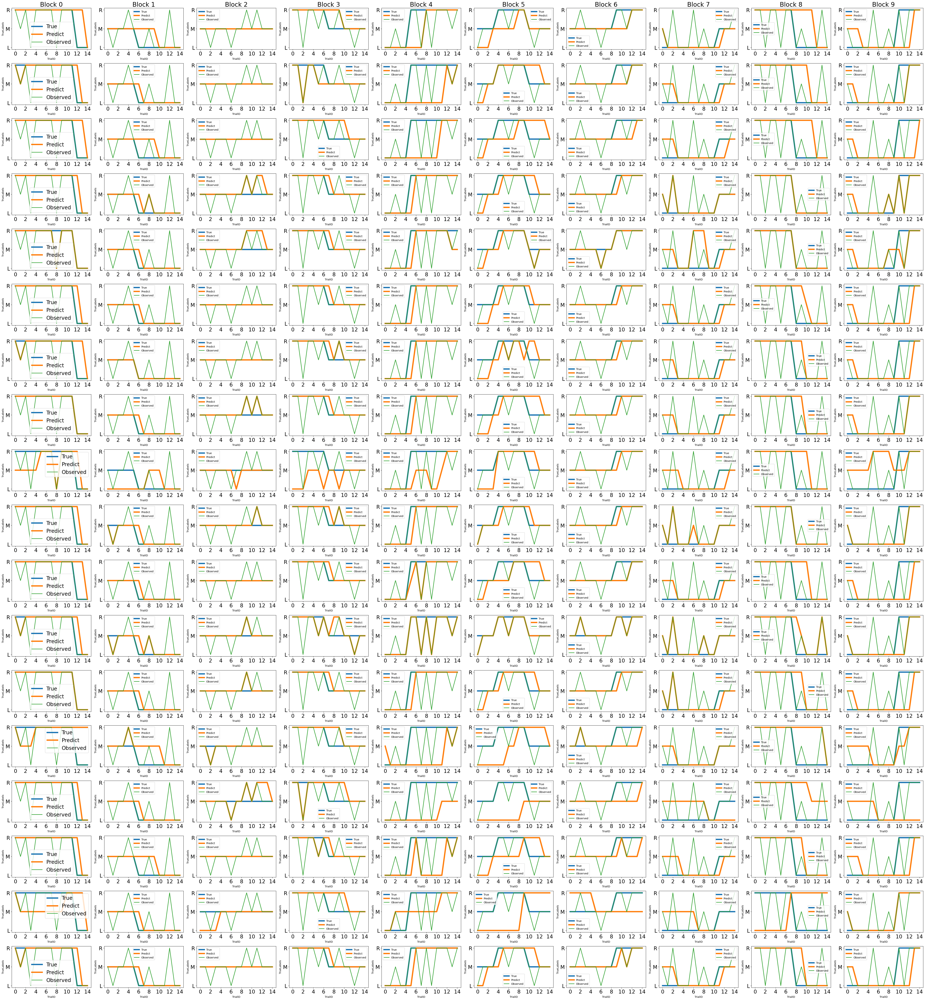

In [4]:
fig, ax = plt.subplots(len(names_BE), nBlocks, figsize = (50,3*len(names_BE)))
for n, name in enumerate(names_BE):
    for b in range(nBlocks):
        sns.lineplot(data = df[(df.SubjectID == name.split('.')[0]) & (df.BlockID == b)], x = 'TrialID', y = 'TrueLabels', ax = ax[n][b], label = 'True', lw = 5)
        sns.lineplot(data = df[(df.SubjectID == name.split('.')[0]) & (df.BlockID == b)], x = 'TrialID', y = 'PredLabels', ax = ax[n][b], label = 'Predict', lw = 5)
        sns.lineplot(data = df[(df.SubjectID == name.split('.')[0]) & (df.BlockID == b)], x = 'TrialID', y = 'ObservedLabel', ax = ax[n][b], label = 'Observed', lw = 2)
        ax[n][b].set_xticks([2*i for i in range(8)])
        ax[n][b].set_xticklabels([2*i for i in range(8)], fontsize = 20)
        ax[0][b].set_title('Block %d'%b, fontsize = 24)
        ax[n][b].set_yticks([_ for _ in range(3)])
        ax[n][b].set_yticklabels(['L', 'M', 'R'], fontsize = 20)
    ax[n][0].legend(prop = {'size':20})
plt.tight_layout()

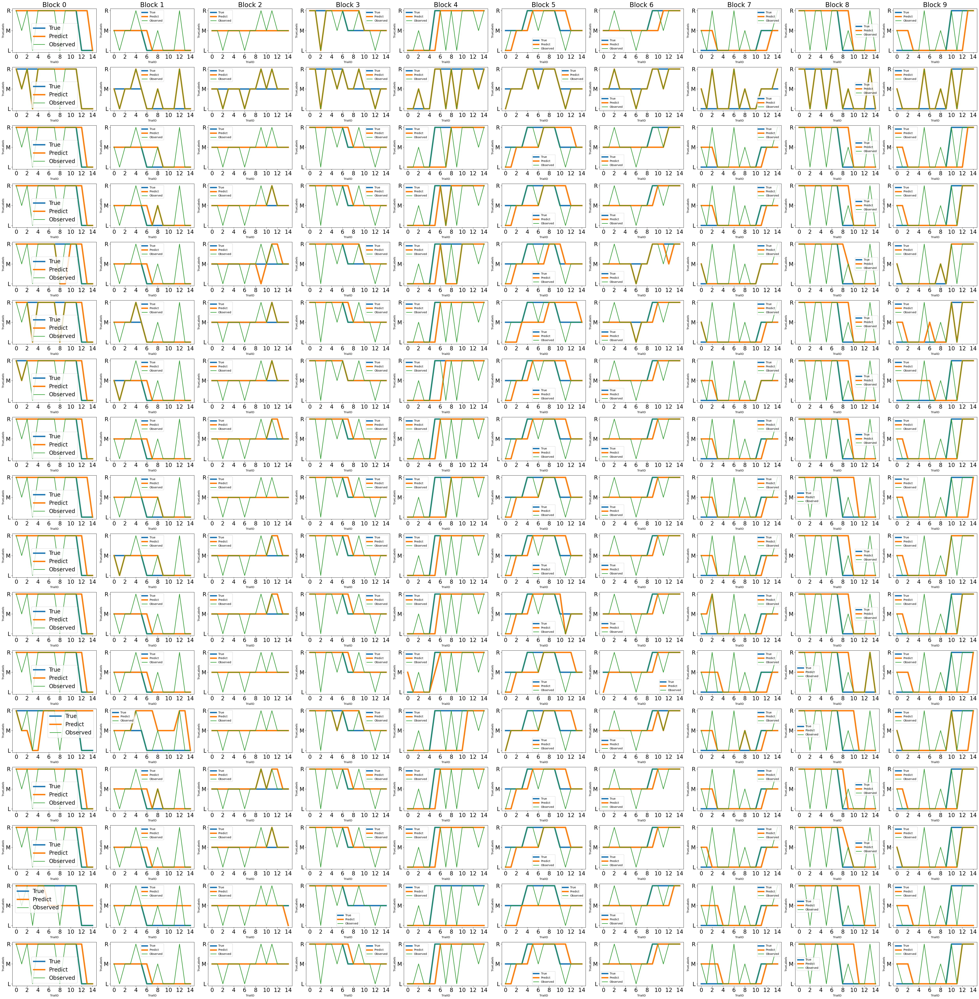

In [5]:
fig, ax = plt.subplots(len(names_HC), nBlocks, figsize = (50,3*len(names_HC)))
for n, name in enumerate(names_HC):
    for b in range(nBlocks):
        sns.lineplot(data = df[(df.SubjectID == name.split('.')[0]) & (df.BlockID == b)], x = 'TrialID', y = 'TrueLabels', ax = ax[n][b], label = 'True', lw = 5)
        sns.lineplot(data = df[(df.SubjectID == name.split('.')[0]) & (df.BlockID == b)], x = 'TrialID', y = 'PredLabels', ax = ax[n][b], label = 'Predict', lw = 5)
        sns.lineplot(data = df[(df.SubjectID == name.split('.')[0]) & (df.BlockID == b)], x = 'TrialID', y = 'ObservedLabel', ax = ax[n][b], label = 'Observed', lw = 2)
        ax[n][b].set_xticks([2*i for i in range(8)])
        ax[n][b].set_xticklabels([2*i for i in range(8)], fontsize = 20)
        ax[0][b].set_title('Block %d'%b, fontsize = 24)
        ax[n][b].set_yticks([_ for _ in range(3)])
        ax[n][b].set_yticklabels(['L', 'M', 'R'], fontsize = 20)
    ax[n][0].legend(prop = {'size':20})
plt.tight_layout()

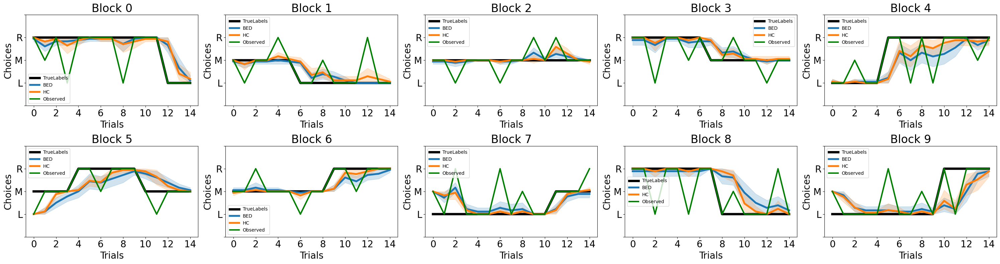

In [6]:
fig, ax = plt.subplots(2, 5, figsize = (30,8))
for b1 in range(2):
    for b2 in range(5):
        sns.lineplot(data = df[(df.BlockID == b1*5+b2)], x = 'TrialID', y = 'TrueLabels', ax = ax[b1][b2], lw = 5, legend = 'brief', c = 'black', label = 'TrueLabels')
        sns.lineplot(data = df[(df.BlockID == b1*5+b2)], x = 'TrialID', y = 'PredLabels', ax = ax[b1][b2],  hue = 'Morbidity', style = 'Morbidity', lw = 4, legend = 'brief', dashes = False)
        sns.lineplot(data = df[(df.BlockID == b1*5+b2)], x = 'TrialID', y = 'ObservedLabel', ax = ax[b1][b2], lw = 3, legend = 'brief', c = 'green', label = 'Observed')

        ax[b1][b2].set_xticks([2*i for i in range(8)])
        ax[b1][b2].set_xticklabels([2*i for i in range(8)], fontsize = 20)
        ax[b1][b2].set_title('Block %d'%(b1*5+b2), fontsize = 24)
        ax[b1][b2].set_yticks([_-1 for _ in range(5)])
        ax[b1][b2].set_yticklabels(['','L', 'M', 'R',''], fontsize = 20)
        ax[b1][b2].legend(prop = {'size':10})
        ax[b1][b2].set_xlabel('Trials', fontsize = 20)
        ax[b1][b2].set_ylabel('Choices', fontsize = 20)
plt.tight_layout()

/var/folders/3d/f9_4dvjj19s_d_fp1l1yql840000gn/T/ipykernel_89976/236853266.py:6: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_HC[n,b] = pearsonr(observ, pred)[0]
/var/folders/3d/f9_4dvjj19s_d_fp1l1yql840000gn/T/ipykernel_89976/236853266.py:13: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_BE[n,b] = pearsonr(observ, pred)[0]


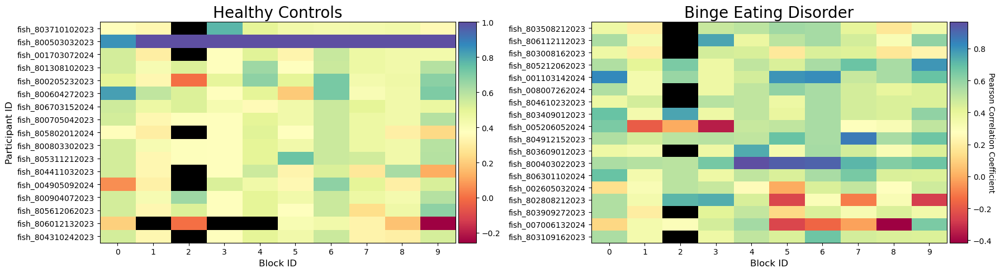

In [7]:
corr_HC = np.zeros((n_HC,nBlocks))
for n, name in enumerate(names_HC):
    for b in range(nBlocks):
        observ = df[(df.SubjectID == name.split('.')[0]) & (df.BlockID == b)].ObservedLabel.to_numpy()
        pred = df[(df.SubjectID == name.split('.')[0]) & (df.BlockID == b)].PredLabels.to_numpy()
        corr_HC[n,b] = pearsonr(observ, pred)[0]

corr_BE = np.zeros((n_BE,nBlocks))
for n, name in enumerate(names_BE):
    for b in range(nBlocks):
        observ = df[(df.SubjectID == name.split('.')[0]) & (df.BlockID == b)].ObservedLabel.to_numpy()
        pred = df[(df.SubjectID == name.split('.')[0]) & (df.BlockID == b)].PredLabels.to_numpy()
        corr_BE[n,b] = pearsonr(observ, pred)[0]

cmap = mpl.colormaps.get_cmap('Spectral')  # viridis is the default colormap for imshow
cmap.set_bad(color='black')

fig,ax = plt.subplots(1,2, figsize = (18,5))
im0 = ax[0].imshow(corr_HC, aspect = 'auto', interpolation = 'none', cmap = cmap)
ax[0].set_title('Healthy Controls', fontsize = 20)
ax[0].set_xlabel('Block ID', fontsize = 12)
ax[0].set_xticks([_ for _ in range(nBlocks)])
ax[0].set_ylabel('Participant ID', fontsize = 12)
ax[0].set_yticks([_ for _ in range(n_HC)])
ax[0].set_yticklabels([name.split('.')[0] for name in names_HC])
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
cbar0 = fig.colorbar(im0, cax=cax)

im1 = ax[1].imshow(corr_BE, aspect = 'auto', interpolation = 'none', cmap = cmap)
ax[1].set_title('Binge Eating Disorder', fontsize = 20)
ax[1].set_xlabel('Block ID', fontsize = 12)
ax[1].set_xticks([_ for _ in range(nBlocks)])
ax[1].set_yticks([_ for _ in range(n_BE)])
ax[1].set_yticklabels([name.split('.')[0] for name in names_BE])
divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='5%', pad=0.05)
cbar1= fig.colorbar(im1, cax=cax)
cbar1.set_label('Pearson Correlation Coefficient', rotation=270)


plt.tight_layout()

## Model Comparison

In [9]:
with open(data_path + 'results/df_fake_heuristic.pickle', 'rb') as fp:
    df_fake_heuristic = pickle.load(fp)
with open(data_path + 'results/df_fake_RW.pickle', 'rb') as fp:
    df_fake_RW = pickle.load(fp)
with open(data_path + 'results/df_fake_BL.pickle', 'rb') as fp:
    df_fake_BL = pickle.load(fp)

with open(data_path + 'results/iter_errors_heuristic.pickle', 'rb') as fp:
    iter_errors_heuristic = pickle.load(fp)
with open(data_path + 'results/iter_errors_RW.pickle', 'rb') as fp:
    iter_errors_RW = pickle.load(fp)
with open(data_path + 'results/iter_errors_BL.pickle', 'rb') as fp:
    iter_errors_BL = pickle.load(fp)

with open(data_path + 'results/iter_errors_MC_heuristic.pickle', 'rb') as fp:
    iter_errors_MC_heuristic = pickle.load(fp)
with open(data_path + 'results/iter_errors_MC_RW.pickle', 'rb') as fp:
    iter_errors_MC_RW = pickle.load(fp)
with open(data_path + 'results/iter_errors_MC_BL.pickle', 'rb') as fp:
    iter_errors_MC_BL = pickle.load(fp)

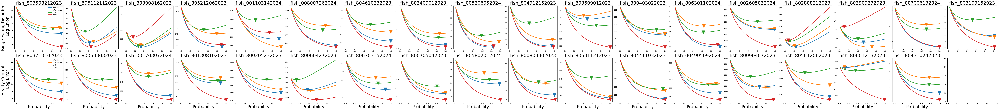

In [10]:
probs = np.linspace(0.01,1,100)

labels = ['df_Orig', 'df_Heuristic', 'df_RL', 'df_BL']

fig, ax = plt.subplots(2, max(n_BE, n_HC), figsize = (90,10))
for n1, name in enumerate(names_BE):
    ax[0][n1].plot(probs, iter_errors_heuristic[n1,:], lw = 3, label = labels[0]) 
    ax[0][n1].scatter(probs[np.argmin(iter_errors_heuristic[n1,:])], min(iter_errors_heuristic[n1,:]), s = 500, marker = 'v')
    for i in range(3):
        ax[0][n1].plot(probs, iter_errors_MC_heuristic['%d'%i][n1,:],  lw = 3, label = labels[i+1]) 
        ax[0][n1].scatter(probs[np.argmin(iter_errors_MC_heuristic['%d'%i][n1,:])], min(iter_errors_MC_heuristic['%d'%i][n1,:]), s = 500, marker = 'v')
    # ax[0][n1].set_xticks([k*5 for k in range(9)])
    # ax[0][n1].set_yticks([k*0.2 for k in range(6)])        
    ax[0][n1].set_title('%s'%name.split('.')[0], fontsize = 30)

for n2, name in enumerate(names_HC):
    ax[1][n2].plot(probs, iter_errors_heuristic[n1+n2+1,:], lw = 3, label = labels[0]) 
    ax[1][n2].scatter(probs[np.argmin(iter_errors_heuristic[n1+n2+1,:])], min(iter_errors_heuristic[n1+n2+1,:]), s = 500, marker = 'v')
    for i in range(3):
        im = ax[1][n2].plot(probs, iter_errors_MC_heuristic['%d'%i][n1+n2+1,:], lw = 3, label = labels[i+1]) 
        ax[1][n2].scatter(probs[np.argmin(iter_errors_MC_heuristic['%d'%i][n1+n2+1,:])], min(iter_errors_MC_heuristic['%d'%i][n1+n2+1,:]), s = 500, marker = 'v')
    # ax[1][n2].set_xticks([k*5 for k in range(9)])
    # ax[1][n2].set_yticks([k*0.2 for k in range(6)])        
    ax[1][n2].set_title('%s'%name.split('.')[0], fontsize = 30)
    ax[1][n2].set_xlabel('Probability', fontsize = 27)
ax[0][0].set_ylabel(f'Binge Eating Disorder \n Log Error', fontsize = 27)
ax[1][0].set_ylabel(f'Healty Control \n Log Error', fontsize = 27)
ax[0][0].legend()
ax[1][0].legend()

plt.tight_layout()

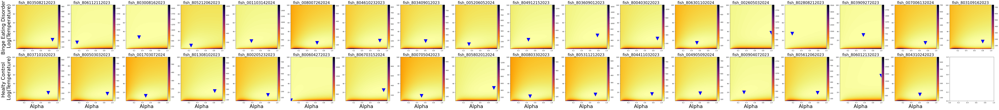

In [11]:
alphas = np.linspace(0.01,1,100)
taus = np.arange(100)+1
X, Y = np.meshgrid(taus, alphas)

fig, ax = plt.subplots(2, max(n_BE, n_HC), figsize = (90,10))
for n1, name in enumerate(names_BE):
    im = ax[0][n1].pcolormesh(Y, X, iter_errors_RW[n1,:,:], cmap = 'inferno_r')
    a_,t_ = np.unravel_index(np.argmin(iter_errors_RW[n1,:,:]), iter_errors_RW[n1,:,:].shape)
    ax[0][n1].scatter(alphas[a_], taus[t_], s = 500, c = 'blue', marker = 'v')
    ax[0][n1].set_title('%s'%name.split('.')[0], fontsize = 24)
    #ax[0][n1].set_yscale('log')
    divider = make_axes_locatable(ax[0][n1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax)
for n2, name in enumerate(names_HC):
    im = ax[1][n2].pcolormesh(Y, X, iter_errors_RW[n1+n2+1,:,:], cmap = 'inferno_r')
    a_,t_ = np.unravel_index(np.argmin(iter_errors_RW[n1+n2+1,:,:]), iter_errors_RW[n1+n2+1,:,:].shape)
    ax[1][n2].scatter(alphas[a_], taus[t_], s = 500, c = 'blue', marker = 'v')
    ax[1][n2].set_title('%s'%name.split('.')[0], fontsize = 24)
    ax[1][n2].set_xlabel('Alpha', fontsize = 32)
    ax[1][n2].set_title('%s'%name.split('.')[0], fontsize = 24)
    #ax[1][n2].set_yscale('log')
    divider = make_axes_locatable(ax[1][n2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax)
ax[0][0].set_ylabel(f'Binge Eating Disorder \n Log(Temperature)', fontsize = 32)
ax[1][0].set_ylabel(f'Healty Control \n Log(Temperature)', fontsize = 32)
plt.tight_layout()

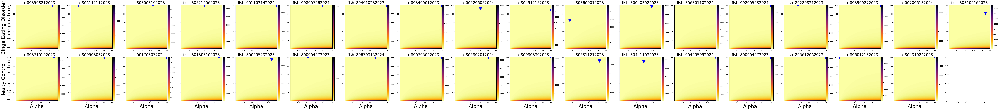

In [12]:
fig, ax = plt.subplots(2, max(n_BE, n_HC), figsize = (90,10))
for n1, name in enumerate(names_BE):
    im = ax[0][n1].pcolormesh(Y, X, iter_errors_MC_RW['0'][n1,:,:], cmap = 'inferno_r')
    a_,t_ = np.unravel_index(np.argmin(iter_errors_MC_RW['0'][n1,:,:]), iter_errors_MC_RW['0'][n1,:,:].shape)
    ax[0][n1].scatter(alphas[a_], taus[t_], s = 500, c = 'blue', marker = 'v')
    ax[0][n1].set_title('%s'%name.split('.')[0], fontsize = 24)
    #ax[0][n1].set_yscale('log')
    divider = make_axes_locatable(ax[0][n1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax)
for n2, name in enumerate(names_HC):
    im = ax[1][n2].pcolormesh(Y, X, iter_errors_MC_RW['0'][n1+n2+1,:,:], cmap = 'inferno_r')
    a_,t_ = np.unravel_index(np.argmin(iter_errors_MC_RW['0'][n1+n2+1,:,:]), iter_errors_MC_RW['0'][n1+n2+1,:,:].shape)
    ax[1][n2].scatter(alphas[a_], taus[t_], s = 500, c = 'blue', marker = 'v')
    ax[1][n2].set_title('%s'%name.split('.')[0], fontsize = 24)
    ax[1][n2].set_xlabel('Alpha', fontsize = 32)
    ax[1][n2].set_title('%s'%name.split('.')[0], fontsize = 24)
    #ax[1][n2].set_yscale('log')
    divider = make_axes_locatable(ax[1][n2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax)
ax[0][0].set_ylabel(f'Binge Eating Disorder \n Log(Temperature)', fontsize = 32)
ax[1][0].set_ylabel(f'Healty Control \n Log(Temperature)', fontsize = 32)
plt.tight_layout()

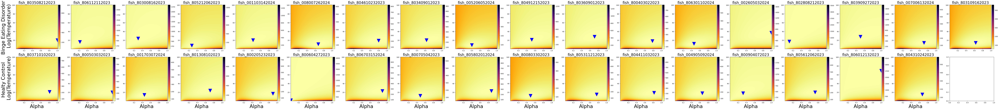

In [13]:
fig, ax = plt.subplots(2, max(n_BE, n_HC), figsize = (90,10))
for n1, name in enumerate(names_BE):
    im = ax[0][n1].pcolormesh(Y, X, iter_errors_MC_RW['1'][n1,:,:], cmap = 'inferno_r')
    a_,t_ = np.unravel_index(np.argmin(iter_errors_MC_RW['1'][n1,:,:]), iter_errors_MC_RW['1'][n1,:,:].shape)
    ax[0][n1].scatter(alphas[a_], taus[t_], s = 500, c = 'blue', marker = 'v')
    ax[0][n1].set_title('%s'%name.split('.')[0], fontsize = 24)
    #ax[0][n1].set_yscale('log')
    divider = make_axes_locatable(ax[0][n1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax)
for n2, name in enumerate(names_HC):
    im = ax[1][n2].pcolormesh(Y, X, iter_errors_MC_RW['1'][n1+n2+1,:,:], cmap = 'inferno_r')
    a_,t_ = np.unravel_index(np.argmin(iter_errors_MC_RW['1'][n1+n2+1,:,:]), iter_errors_MC_RW['1'][n1+n2+1,:,:].shape)
    ax[1][n2].scatter(alphas[a_], taus[t_], s = 500, c = 'blue', marker = 'v')
    ax[1][n2].set_title('%s'%name.split('.')[0], fontsize = 24)
    ax[1][n2].set_xlabel('Alpha', fontsize = 32)
    ax[1][n2].set_title('%s'%name.split('.')[0], fontsize = 24)
    #ax[1][n2].set_yscale('log')
    divider = make_axes_locatable(ax[1][n2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax)
ax[0][0].set_ylabel(f'Binge Eating Disorder \n Log(Temperature)', fontsize = 32)
ax[1][0].set_ylabel(f'Healty Control \n Log(Temperature)', fontsize = 32)
plt.tight_layout()

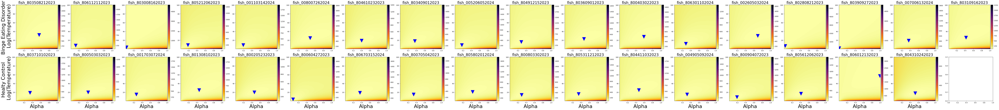

In [14]:
fig, ax = plt.subplots(2, max(n_BE, n_HC), figsize = (90,10))
for n1, name in enumerate(names_BE):
    im = ax[0][n1].pcolormesh(Y, X, iter_errors_MC_RW['2'][n1,:,:], cmap = 'inferno_r')
    a_,t_ = np.unravel_index(np.argmin(iter_errors_MC_RW['2'][n1,:,:]), iter_errors_MC_RW['2'][n1,:,:].shape)
    ax[0][n1].scatter(alphas[a_], taus[t_], s = 500, c = 'blue', marker = 'v')
    ax[0][n1].set_title('%s'%name.split('.')[0], fontsize = 24)
    #ax[0][n1].set_yscale('log')
    divider = make_axes_locatable(ax[0][n1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax)
for n2, name in enumerate(names_HC):
    im = ax[1][n2].pcolormesh(Y, X, iter_errors_MC_RW['2'][n1+n2+1,:,:], cmap = 'inferno_r')
    a_,t_ = np.unravel_index(np.argmin(iter_errors_MC_RW['2'][n1+n2+1,:,:]), iter_errors_MC_RW['2'][n1+n2+1,:,:].shape)
    ax[1][n2].scatter(alphas[a_], taus[t_], s = 500, c = 'blue', marker = 'v')
    ax[1][n2].set_title('%s'%name.split('.')[0], fontsize = 24)
    ax[1][n2].set_xlabel('Alpha', fontsize = 32)
    ax[1][n2].set_title('%s'%name.split('.')[0], fontsize = 24)
    #ax[1][n2].set_yscale('log')
    divider = make_axes_locatable(ax[1][n2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax)
ax[0][0].set_ylabel(f'Binge Eating Disorder \n Log(Temperature)', fontsize = 32)
ax[1][0].set_ylabel(f'Healty Control \n Log(Temperature)', fontsize = 32)
plt.tight_layout()

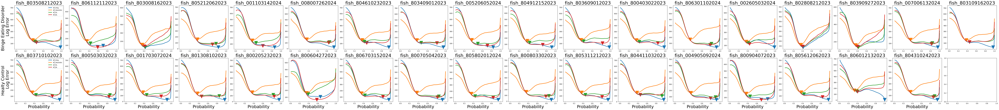

In [15]:
lambdas = np.linspace(0.01,1,100)

labels = ['df_Orig', 'df_Heuristic', 'df_RL', 'df_BL']

fig, ax = plt.subplots(2, max(n_BE, n_HC), figsize = (90,10))
for n1, name in enumerate(names_BE):
    ax[0][n1].plot(lambdas, iter_errors_BL[n1,:], lw = 3, label = labels[0]) 
    ax[0][n1].scatter(lambdas[np.argmin(iter_errors_BL[n1,:])], min(iter_errors_BL[n1,:]), s = 500, marker = 'v')
    for i in range(3):
        ax[0][n1].plot(lambdas, iter_errors_MC_BL['%d'%i][n1,:],  lw = 3, label = labels[i+1]) 
        ax[0][n1].scatter(lambdas[np.argmin(iter_errors_MC_BL['%d'%i][n1,:])], min(iter_errors_MC_BL['%d'%i][n1,:]), s = 500, marker = 'v')
    # ax[0][n1].set_xticks([k*5 for k in range(9)])
    # ax[0][n1].set_yticks([k*0.2 for k in range(6)])        
    ax[0][n1].set_title('%s'%name.split('.')[0], fontsize = 30)

for n2, name in enumerate(names_HC):
    ax[1][n2].plot(lambdas, iter_errors_BL[n1+n2+1,:], lw = 3, label = labels[0]) 
    ax[1][n2].scatter(lambdas[np.argmin(iter_errors_BL[n1+n2+1,:])], min(iter_errors_BL[n1+n2+1,:]), s = 500, marker = 'v')
    for i in range(3):
        im = ax[1][n2].plot(lambdas, iter_errors_MC_BL['%d'%i][n1+n2+1,:], lw = 3, label = labels[i+1]) 
        ax[1][n2].scatter(lambdas[np.argmin(iter_errors_MC_BL['%d'%i][n1+n2+1,:])], min(iter_errors_MC_BL['%d'%i][n1+n2+1,:]), s = 500, marker = 'v')
    # ax[1][n2].set_xticks([k*5 for k in range(9)])
    # ax[1][n2].set_yticks([k*0.2 for k in range(6)])        
    ax[1][n2].set_title('%s'%name.split('.')[0], fontsize = 30)
    ax[1][n2].set_xlabel('Probability', fontsize = 27)
ax[0][0].set_ylabel(f'Binge Eating Disorder \n Log Error', fontsize = 27)
ax[1][0].set_ylabel(f'Healty Control \n Log Error', fontsize = 27)
ax[0][0].legend()
ax[1][0].legend()

plt.tight_layout()

In [118]:
def BIC(logllhood, k, T):
    return(-2*np.log(logllhood) + k*np.log(T))

In [120]:
BIC_matrix = np.zeros((3,3))

BIC_matrix[0,0] = BIC(iter_errors_MC_heuristic['%d'%0].mean(axis = 0).min(),1,150)
# BIC_matrix[1,0] = BIC(iter_errors_MC_RW['%d'%0].mean(axis = 0).min(),2,1500)
# BIC_matrix[2,0] = BIC(iter_errors_MC_BL['%d'%0].mean(axis = 0).min(),1,1500)

# BIC_matrix[0,1] = BIC(iter_errors_MC_heuristic['%d'%1].mean(axis = 0).min(),1,1500)
BIC_matrix[1,1] = BIC(iter_errors_MC_RW['%d'%1].mean(axis = 0).min(),2,150)
# BIC_matrix[2,1] = BIC(iter_errors_MC_BL['%d'%1].mean(axis = 0).min(),1,1500)

# BIC_matrix[0,2] = BIC(iter_errors_MC_heuristic['%d'%2].mean(axis = 0).min(),1,1500)
# BIC_matrix[1,2] = BIC(iter_errors_MC_RW['%d'%2].mean(axis = 0).min(),2,1500)
BIC_matrix[2,2] = BIC(iter_errors_MC_BL['%d'%2].mean(axis = 0).min(),1,150)

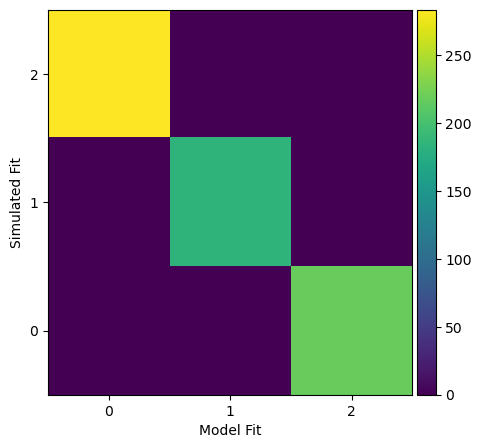

In [124]:
fig,ax = plt.subplots(1,1,figsize = (5,5))
im = ax.imshow(BIC_matrix, aspect = 'auto', interpolation = 'none', extent = [-0.5,2.5, -0.5, 2.5], cmap = 'viridis')
ax.set_xticks([0,1,2])
ax.set_yticks([0,1,2])
ax.set_xlabel('Model Fit', fontsize = 10)
ax.set_ylabel('Simulated Fit', fontsize = 10)

divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
cbar1= fig.colorbar(im, cax=cax)
# cbar1.set_label('BIC', rotation=270)